# Stock Market Analysis

In [1]:
#pip install statsmodels

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings("ignore")

In [3]:
data = pd.read_csv('Reliance_Daily_Dataset.csv', parse_dates=True)

In [4]:
data.head()

,Date,Open,High,Low,Close,Adj Close,Volume,No. of Shares,No. of Trades,Change(%)
0,01-01-2015,438.988831,441.812073,437.676270,439.781311,417.988892,1367720.0,181432,9740,-0.36%
1,02-01-2015,439.880371,443.818054,437.998199,438.617340,416.882599,3383424.0,260835,19270,-0.26%
2,05-01-2015,438.344940,441.267212,432.946106,433.812897,412.316284,4662967.0,328788,39864,-1.10%
3,06-01-2015,430.915344,432.401276,412.093750,414.124512,393.603546,8596809.0,975422,26226,-4.54%
4,07-01-2015,414.619812,425.367950,414.570282,423.139069,402.171295,9562421.0,660342,24450,2.18%


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1994 entries, 0 to 1993
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           1994 non-null   object 
 1   Open           1993 non-null   float64
 2   High           1993 non-null   float64
 3   Low            1993 non-null   float64
 4   Close          1993 non-null   float64
 5   Adj Close      1993 non-null   float64
 6   Volume         1993 non-null   float64
 7   No. of Shares  1994 non-null   int64  
 8   No. of Trades  1994 non-null   int64  
 9   Change(%)      1994 non-null   object 
dtypes: float64(6), int64(2), object(2)
memory usage: 155.9+ KB


In [6]:
data.shape

(1994, 10)

In [7]:
data.dtypes

Date              object
Open             float64
High             float64
Low              float64
Close            float64
Adj Close        float64
Volume           float64
No. of Shares      int64
No. of Trades      int64
Change(%)         object
dtype: object

In [8]:
data.describe()

,Open,High,Low,Close,Adj Close,Volume,No. of Shares,No. of Trades
count,1993.000000,1993.000000,1993.000000,1993.000000,1993.000000,1.993000e+03,1.994000e+03,1994.000000
mean,1325.408942,1340.337026,1309.627319,1324.338416,1310.028971,9.065886e+06,1.208584e+06,15963.536610
std,756.093558,764.161654,747.138000,755.248519,759.572609,6.673385e+06,1.556644e+07,13699.099477
min,404.466064,405.010895,394.485657,401.568542,381.669708,7.871600e+05,4.245200e+04,2476.000000
25%,532.056641,538.891846,528.143738,532.725281,517.503967,5.241641e+06,2.364888e+05,7634.000000
50%,1183.679932,1203.591187,1165.947998,1181.401489,1166.302734,7.126831e+06,3.553470e+05,11815.500000
75%,2061.949951,2089.800049,2035.000000,2057.800049,2047.086792,1.022708e+07,5.781165e+05,19149.250000
max,2856.149902,2856.149902,2786.100098,2819.850098,2811.385742,6.584835e+07,3.973114e+08,113895.000000


In [9]:
data.isnull().sum()

Date             0
Open             1
High             1
Low              1
Close            1
Adj Close        1
Volume           1
No. of Shares    0
No. of Trades    0
Change(%)        0
dtype: int64

In [10]:
data[data.isnull()]

,Date,Open,High,Low,Close,Adj Close,Volume,No. of Shares,No. of Trades,Change(%)
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
1989,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1990,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
data.dropna(inplace=True)   

In [12]:
data.shape #only loss of 1 row

(1993, 10)

In [13]:
#Renaming the columns

data.rename(columns = {'No. of Shares':'Shares', 'No. of Trades':'Trades'}, inplace=True)

### Feature Selection

In [14]:
RIL_data = data[['Date','Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']]
RIL_data

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-01-2015,438.988831,441.812073,437.676270,439.781311,417.988892,1367720.0
1,02-01-2015,439.880371,443.818054,437.998199,438.617340,416.882599,3383424.0
2,05-01-2015,438.344940,441.267212,432.946106,433.812897,412.316284,4662967.0
3,06-01-2015,430.915344,432.401276,412.093750,414.124512,393.603546,8596809.0
4,07-01-2015,414.619812,425.367950,414.570282,423.139069,402.171295,9562421.0
...,...,...,...,...,...,...,...
1989,24-01-2023,2440.000000,2443.649902,2387.350098,2415.949951,2415.949951,7609558.0
1990,25-01-2023,2412.449951,2414.699951,2380.000000,2382.550049,2382.550049,5715684.0
1991,27-01-2023,2384.399902,2387.350098,2311.649902,2337.350098,2337.350098,11920991.0
1992,30-01-2023,2331.699951,2371.899902,2301.000000,2359.750000,2359.750000,10047822.0


In [15]:
RIL_data['Date'] = pd.to_datetime(RIL_data['Date'], format="%d-%m-%Y")
RIL_data.set_index('Date', inplace=True)
#RIL_data.index.freq='MS'
RIL_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1993 entries, 2015-01-01 to 2023-01-31
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       1993 non-null   float64
 1   High       1993 non-null   float64
 2   Low        1993 non-null   float64
 3   Close      1993 non-null   float64
 4   Adj Close  1993 non-null   float64
 5   Volume     1993 non-null   float64
dtypes: float64(6)
memory usage: 109.0 KB


## EDA

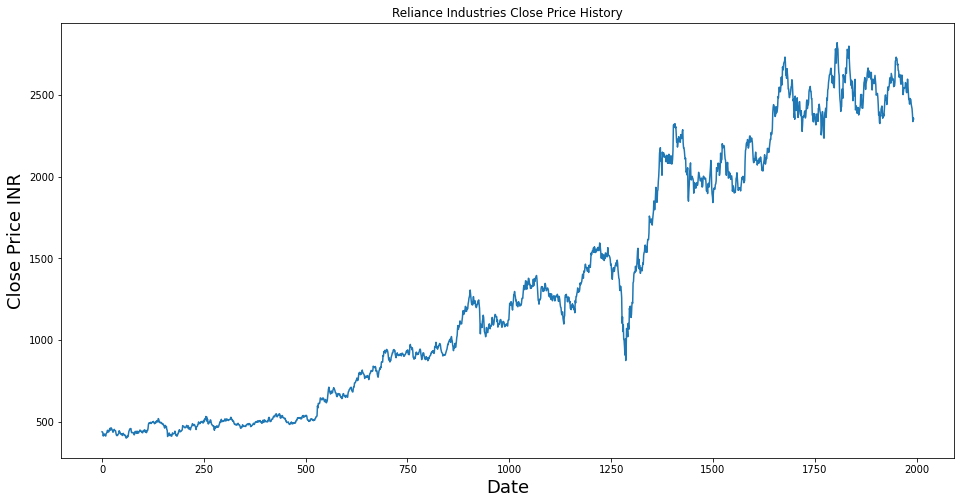

In [16]:
#Visualize the closing price history
plt.figure(figsize=(16,8))
plt.title('Reliance Industries Close Price History')
plt.plot(data['Close'])
plt.xlabel('Date',fontsize=18)
plt.ylabel('Close Price INR',fontsize=18)
plt.show()

#### Moving Averages (MA)

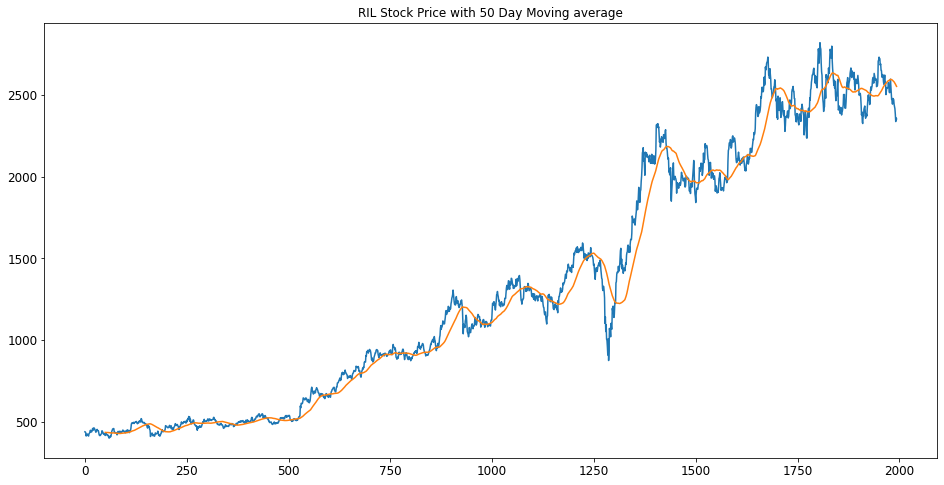

In [17]:
ma=50 #50 day moving average
plt.figure(figsize=(16,8))
ax = data['Close'].plot(title="RIL Stock Price with 50 Day Moving average", fontsize=12)
moving_average = data['Close'].rolling(ma).mean() 
moving_average.plot(label='Rolling mean', ax=ax)
plt.show()

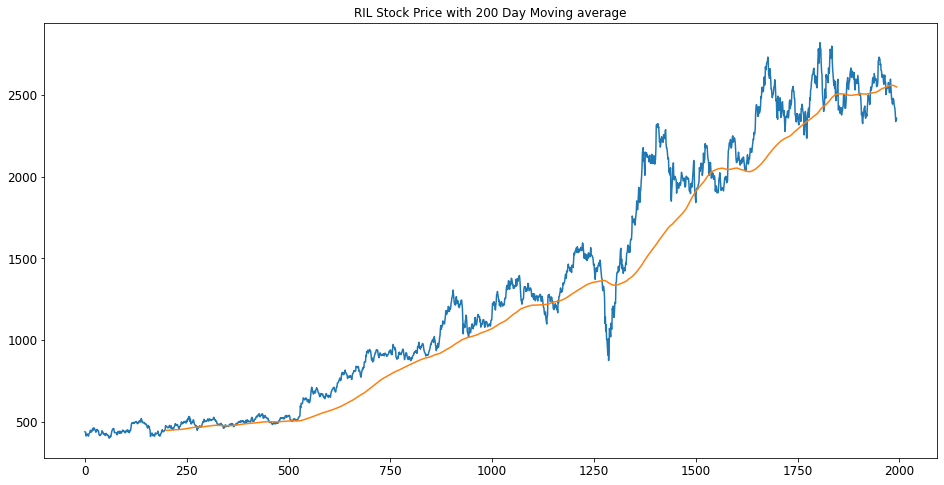

In [18]:
ma=200 #200 day moving average
plt.figure(figsize=(16,8))
ax = data['Close'].plot(title="RIL Stock Price with 200 Day Moving average", fontsize=12)
moving_average = data['Close'].rolling(ma).mean() 
moving_average.plot(label='Rolling mean', ax=ax)
plt.show()

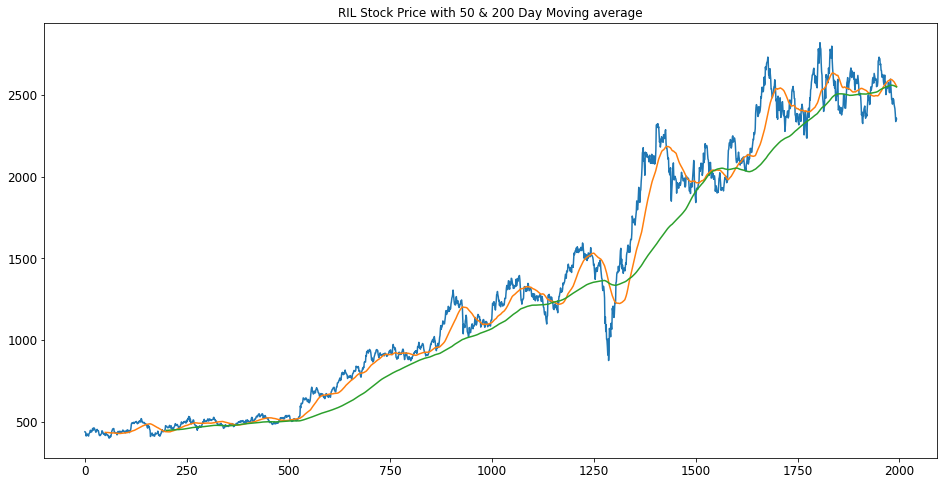

In [19]:
#Moving averages crossover
#The “cross” refers to two simple moving averages “crossing” over each other.
plt.figure(figsize=(16,8))
ax = data['Close'].plot(title="RIL Stock Price with 50 & 200 Day Moving average", fontsize=12)

data['Close'].rolling(50).mean().plot(label='Rolling mean', ax=ax)
data['Close'].rolling(200).mean().plot(label='Rolling mean', ax=ax)
plt.show()

#### Reliance Industries stock attributes from 2015 to 2020

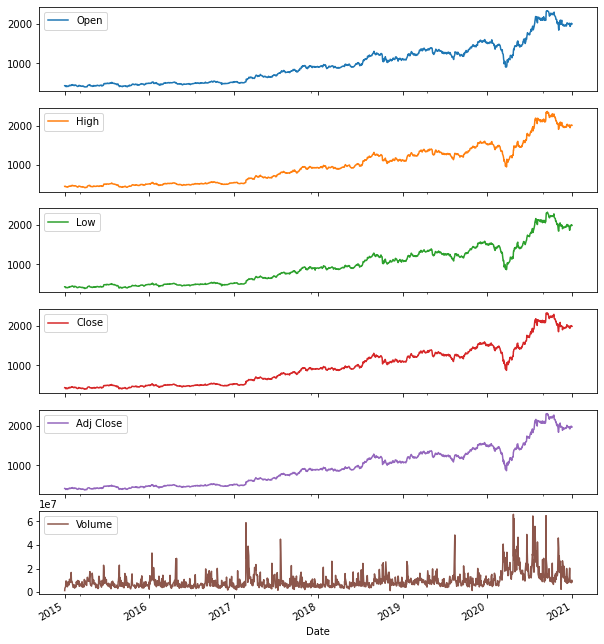

In [20]:
RIL_data['2015':'2020'].plot(subplots=True, figsize=(10,12))

plt.savefig('stocks15_20.png')
plt.show()

#### Reliance Industries stock attributes from 2020 to 2022

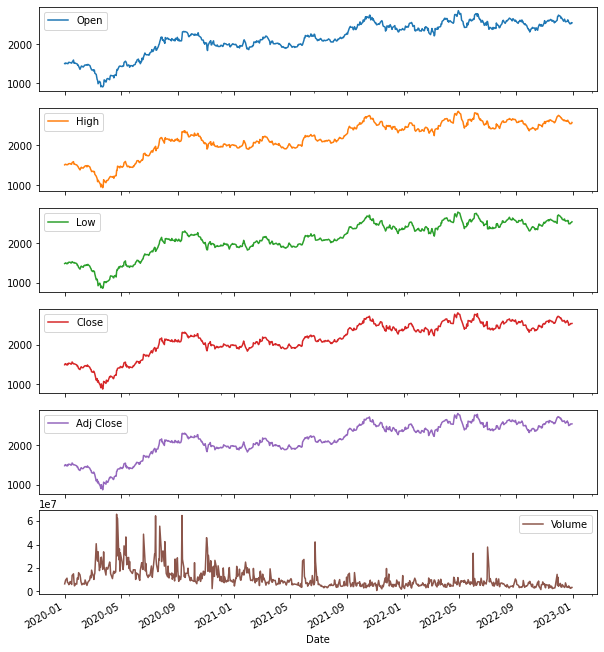

In [21]:
RIL_data['2020':'2022'].plot(subplots=True, figsize=(10,12))

plt.savefig('stocks19_20.png')
plt.show()

### OHLC charts

An OHLC chart is a type of bar chart that shows open, high, low, and closing prices for each period. OHLC charts are useful since they show the four major data points over a period, with the closing price being considered the most important by many traders. 
Source: https://www.investopedia.com/terms/o/ohlcchart.asp

In [23]:
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.figure_factory as ff

trace = go.Ohlc(x=RIL_data['2020'].index,
                open=RIL_data['2020'].Open,
                high=RIL_data['2020'].High,
                low=RIL_data['2020'].Low,
                close=RIL_data['2020'].Close)
data1 = [trace]

iplot(data1, filename='simple_ohlc')

### Candlestick charts - RIL for Deccember 2022 (Plotly Slider)

Candlestick charts are used by traders to determine possible price movement based on past patterns.

Source: https://www.investopedia.com/terms/o/ohlcchart.a

In [24]:
trace = go.Candlestick(x=RIL_data['12-2022'].index,
                open=RIL_data['12-2022'].Open,
                high=RIL_data['12-2022'].High,
                low=RIL_data['12-2022'].Low,
                close=RIL_data['12-2022'].Close)
data1 = [trace]
iplot(data1, filename='simple_candlestick')

In [25]:
df = pd.read_csv('Reliance_Daily_Dataset.csv')
df['Date'] = pd.to_datetime(df['Date'], format="%d-%m-%Y")
df["year"] = df.Date.dt.strftime("%Y") # year extraction

#### Trend

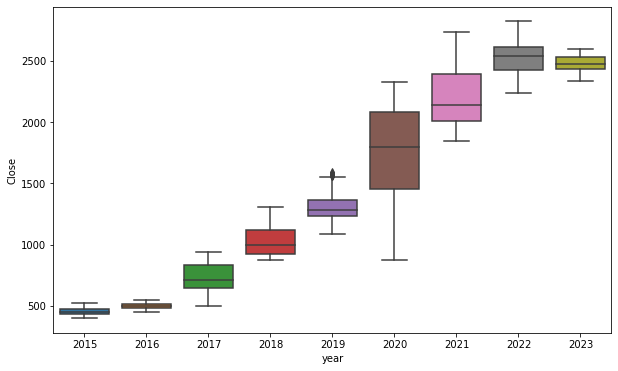

In [26]:
plt.figure(figsize=(10,6))
sns.boxplot(x='year',y="Close",data=df)
plt.show()

### ACF plots and PACF plots

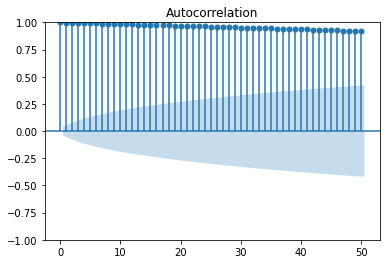

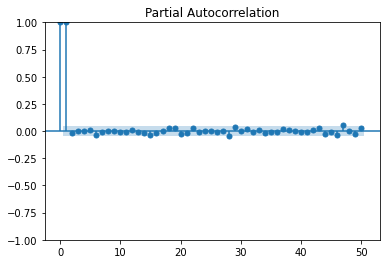

In [27]:
import statsmodels.graphics.tsaplots as tsa_plots
tsa_plots.plot_acf(data['Close'],lags=50)
tsa_plots.plot_pacf(data['Close'],lags=50)
plt.show()

## Auto EDA

### Performing Auto EDA using few liabraries as below

In [28]:
#!pip install dtale

### Dtale 

In [29]:
import dtale

d = dtale.show(RIL_data)
d.open_browser()

#Gives output in a different browser window

### Pandas-Profiling

In [30]:
import pandas_profiling

pandas_profiling.ProfileReport(RIL_data)

2023-03-12 14:16:00,695 - INFO     - Pandas backend loaded 1.4.2
2023-03-12 14:16:00,735 - INFO     - Numpy backend loaded 1.21.5
2023-03-12 14:16:00,743 - INFO     - Pyspark backend NOT loaded
2023-03-12 14:16:00,743 - INFO     - Python backend loaded


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Sweetviz

In [31]:
#!pip install sweetviz

In [32]:
import sweetviz

my_report  = sweetviz.analyze(RIL_data)
my_report.show_html('FinalReport.html')

                                             |                                             | [  0%]   00:00 ->…

Report FinalReport.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


### AutoViz

In [33]:
#!pip install autoviz

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
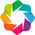

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine
Shape of your Data Set loaded: (1994, 10)
#######################################################################################
######################## C L A S S 

,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Date,1994,object,0,0.000000,100.000000,1,"combine rare categories, possible ID column: drop"
Volume,1993,float64,1,0.050150,99.949850,0,"fill missing, skewed: cap or drop outliers"
No. of Shares,1989,int64,0,0.000000,99.749248,0,
Adj Close,1949,float64,1,0.050150,97.743230,0,fill missing
Close,1935,float64,1,0.050150,97.041123,0,fill missing
No. of Trades,1922,int64,0,0.000000,96.389168,0,
High,1851,float64,1,0.050150,92.828485,0,fill missing
Low,1847,float64,1,0.050150,92.627884,0,fill missing
Open,1773,float64,1,0.050150,88.916750,0,fill missing
Change(%),652,object,0,0.000000,32.698094,1,combine rare categories


    10 Predictors classified...
        1 variables removed since they were ID or low-information variables
        List of variables removed: ['Date']
Number of All Scatter Plots = 21


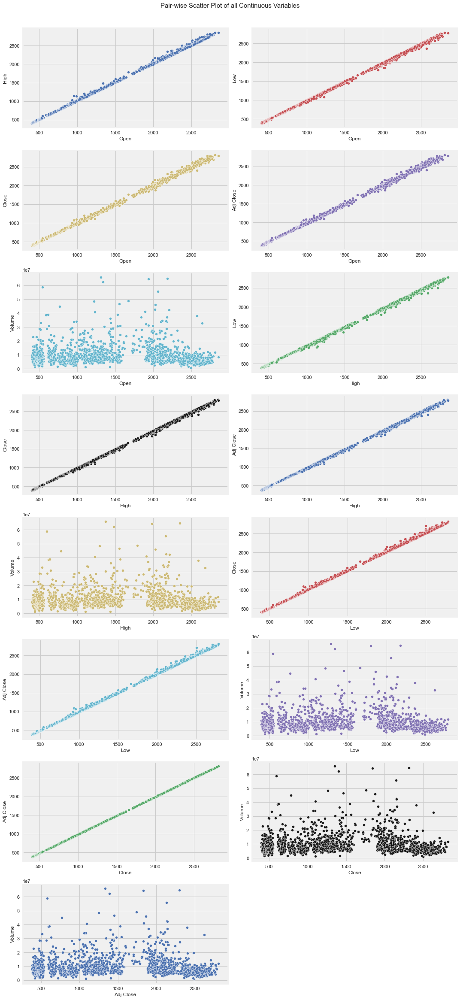

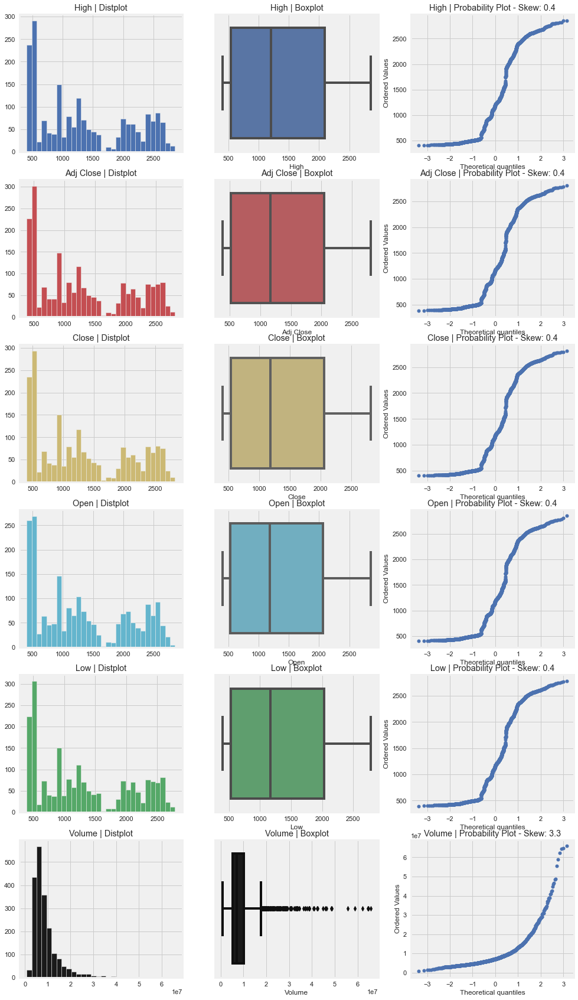

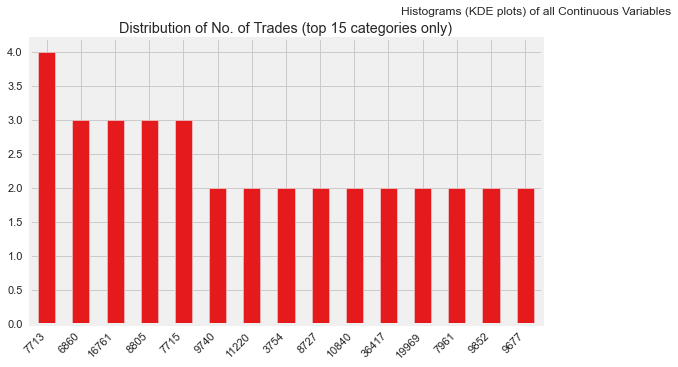

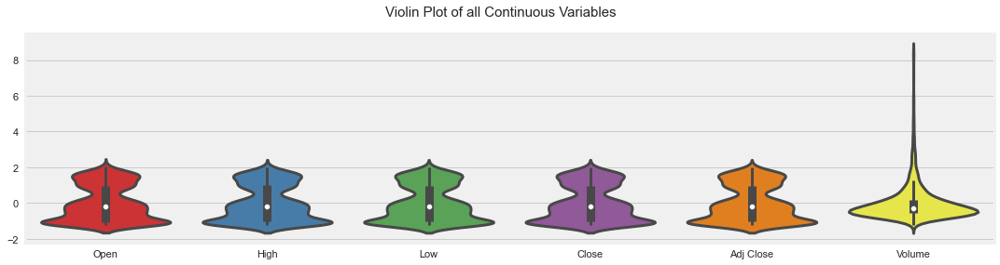

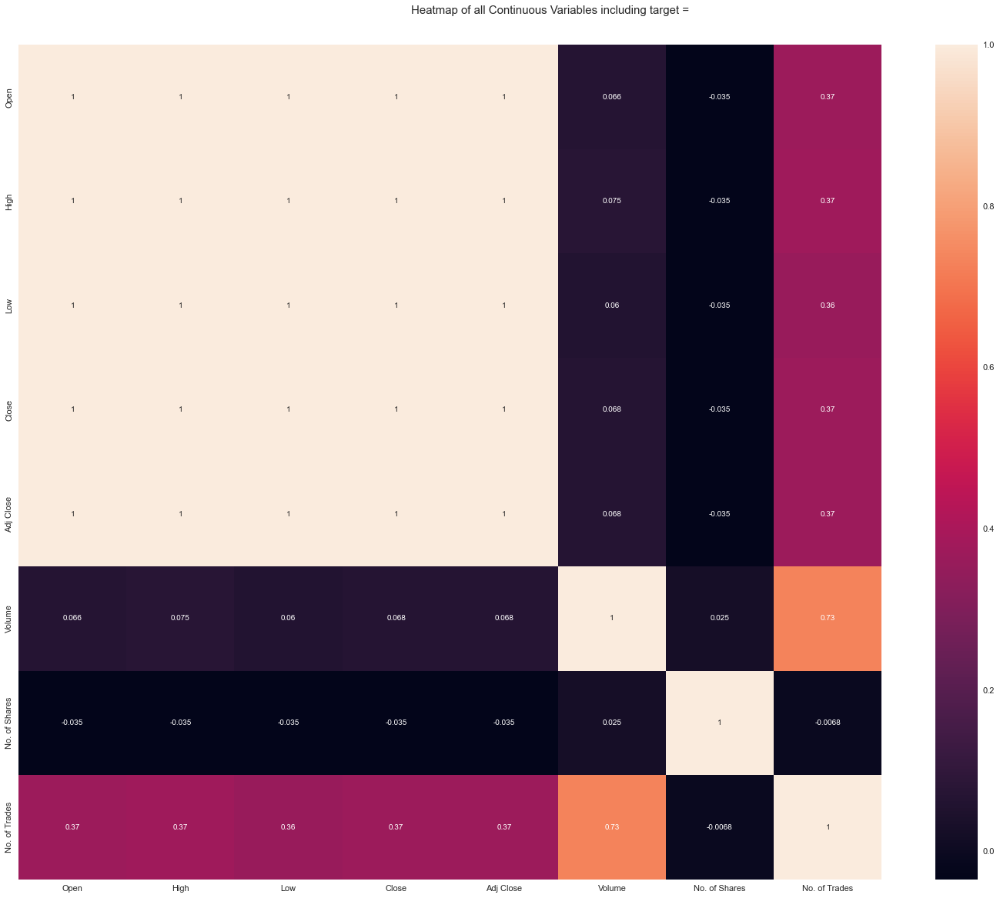

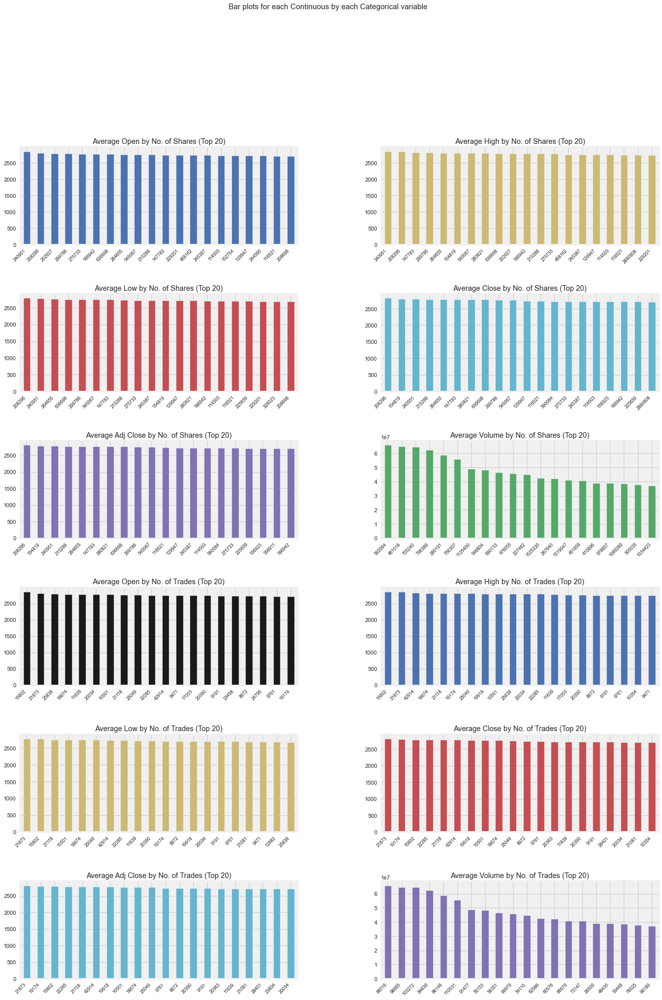

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     C:\Users\Mansi\AppData\Roaming\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     C:\Users\Mansi\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     C:\Users\Mansi\AppData\Roaming\nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     C:\Users\Mansi\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     C:\Users\Mansi\AppData\Roaming\nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]   

Could not draw wordcloud plot for Change(%)
All Plots done
Time to run AutoViz = 28 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


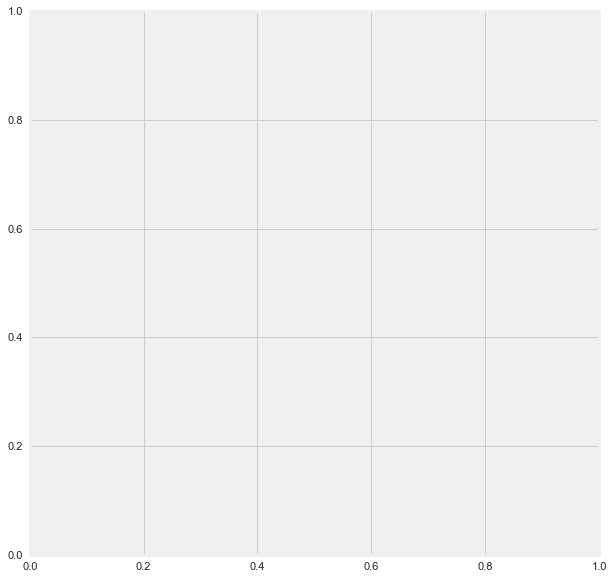

In [34]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

AV = AutoViz_Class()
df = AV.AutoViz('Reliance_Daily_Dataset.csv')

## Checking For Stationarity using ADF(Augmented Dickey Fuller Test)

Stationarity means mean, variance & covariance is constant over periods

In [35]:
#!pip install statsmodels==0.12.1

In [36]:
from statsmodels.tsa.stattools import adfuller
def ad_test(dataset):
     dftest = adfuller(dataset, autolag = 'AIC')
     print("1. ADF : ",dftest[0])
     print("2. P-Value : ", dftest[1])
     print("3. Num Of Lags : ", dftest[2])
     print("4. Num Of Observations Used For ADF Regression:",      dftest[3])
     print("5. Critical Values :")
     for key, val in dftest[4].items():
         print("\t",key, ": ", val)
ad_test(RIL_data['Close'])

1. ADF :  -0.6717794325268911
2. P-Value :  0.8539245265882078
3. Num Of Lags :  5
4. Num Of Observations Used For ADF Regression: 1987
5. Critical Values :
	 1% :  -3.433645303487856
	 5% :  -2.8629956824317757
	 10% :  -2.5675449439803617


<AxesSubplot: xlabel='Date'>

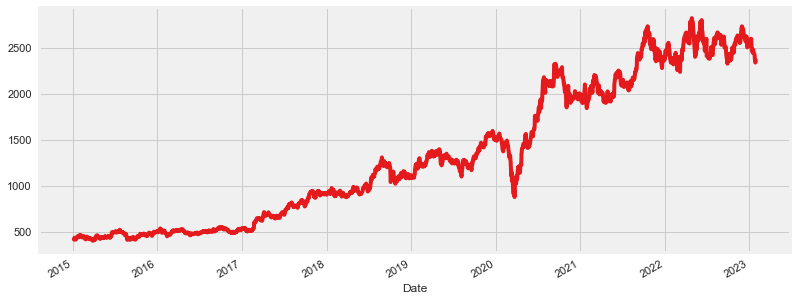

In [37]:
RIL_data['Close'].plot(figsize=(12,5))

###### P-Value :  0.8539245265882078 
Hence, Data is not stationary.

### Converting to stationary

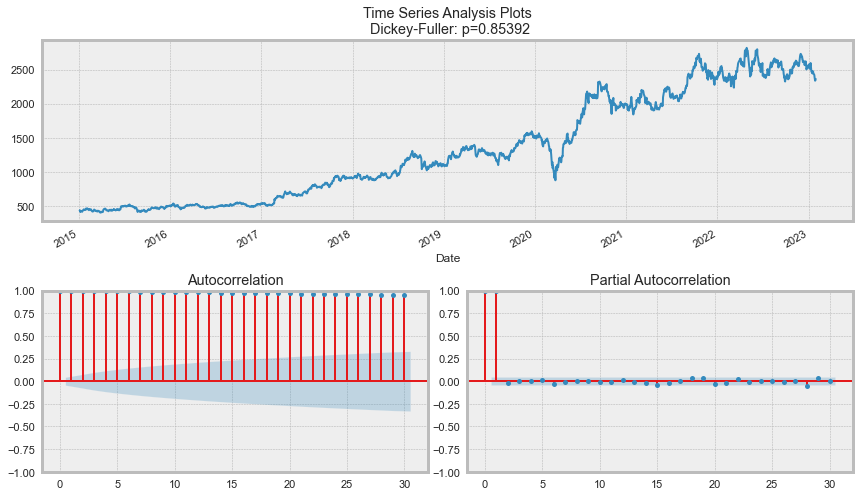

In [38]:
from scipy.optimize import minimize
import statsmodels.tsa.api as smt
import statsmodels.api as sm

def tsplot(y, lags=5, figsize=(12, 7), syle='bmh'):
    
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style='bmh'):
        fig = plt.figure(figsize=figsize)
        layout = (2,2)
        ts_ax = plt.subplot2grid(layout, (0,0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1,0))
        pacf_ax = plt.subplot2grid(layout, (1,1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()
        
tsplot(RIL_data.Close, lags=30)

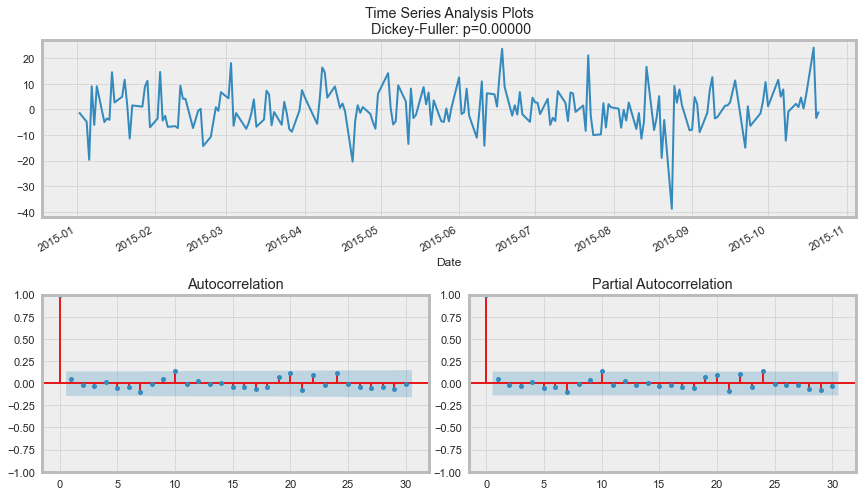

In [39]:
data_close = RIL_data.Close - RIL_data.Close.shift(1)

tsplot(data_close[1:200], lags=30)

<AxesSubplot: xlabel='Date'>

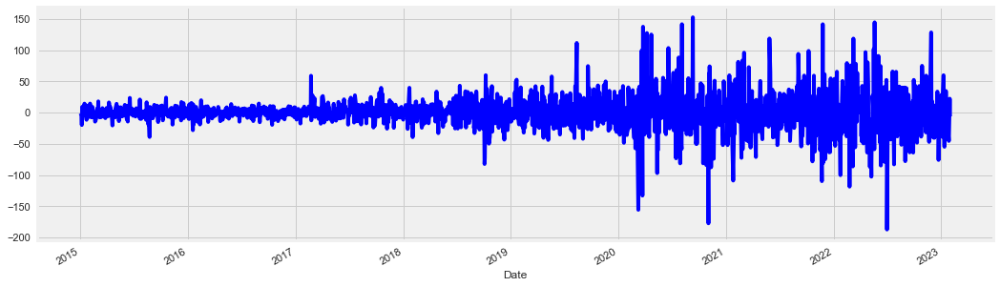

In [42]:
data_close.plot(figsize=(16,5), color = 'blue')

### Outlier Detection

In [43]:
#Using Z-Score by setting a threshold value of 3 std
import numpy as np
outliers = []
def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    # print(mean, std)
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers
sample_outliers = detect_outliers_zscore(RIL_data['Close'])
print("Outliers from Z-scores method: ", sample_outliers)

Outliers from Z-scores method:  []


In [44]:
#Using Inter Quartile Range(IQR)
outliers = []
def detect_outliers_iqr(data):
    data = sorted(data)
    q1 = np.percentile(data, 25)
    q3 = np.percentile(data, 75)
    # print(q1, q3)
    IQR = q3-q1
    lwr_bound = q1-(1.5*IQR)
    upr_bound = q3+(1.5*IQR)
    # print(lwr_bound, upr_bound)
    for i in data: 
        if (i<lwr_bound or i>upr_bound):
            outliers.append(i)
    return outliers# Driver code
sample_outliers = detect_outliers_iqr(RIL_data['Close'])
print("Outliers from IQR method: ", sample_outliers)

Outliers from IQR method:  []


##### Gives no outliers outside of 3 standard deviation & no data points that lie 1.5 times of IQR above Q3 and below Q1

<AxesSubplot: >

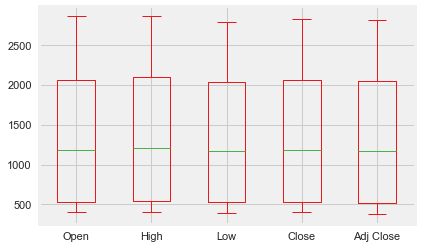

In [45]:
#Using Box Plot 

RIL_data[['Open', 'High', 'Low', 'Close', 'Adj Close']].plot(kind='box')

## Model Building

### Auto Regression(AR)

In [46]:
from statsmodels.tsa.ar_model import AutoReg

X=data_close[1:].values

In [47]:
# Splitting dataset into train & test 

Trainc = X[:len(X)-30]
Testc = X[len(X)-30:]

In [48]:
model_AR = AutoReg(Trainc, lags=10).fit()

In [49]:
print(model_AR.summary())

                            AutoReg Model Results                             
Dep. Variable:                      y   No. Observations:                 1962
Model:                    AutoReg(10)   Log Likelihood               -9212.261
Method:               Conditional MLE   S.D. of innovations             27.125
Date:                Sun, 12 Mar 2023   AIC                          18448.522
Time:                        14:18:18   BIC                          18515.441
Sample:                            10   HQIC                         18473.124
                                 1962                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.1233      0.619      1.814      0.070      -0.091       2.337
y.L1           0.0223      0.023      0.987      0.324      -0.022       0.067
y.L2           0.0176      0.023      0.777      0.4

In [50]:
pred = model_AR.predict(start=len(Trainc), end=len(X)-1, dynamic=False)

[ 5.13482015  2.76103883 -1.24605559 -2.17315163  3.10602776  2.54307754
  0.41347282 -0.64844913  0.32110448  2.15748481  1.5196612   1.26389413
  0.91163304  0.91902538  1.23639936  1.21865658  1.09849018  1.03075744
  1.06200594  1.14701579  1.14147103  1.12334322  1.10085255  1.10165101
  1.11850835  1.11990456  1.11399813  1.10933074  1.10998008  1.11414792]


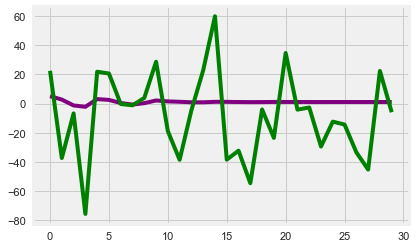

In [51]:
plt.plot(pred, color='purple')
plt.plot(Testc, color='green')
print(pred)

#### Model Accuracy

In [52]:
def mape(y_test, pred):
    y_test, pred = np.array(y_test), np.array(pred)
    mape = np.mean(np.abs((y_test - pred) / y_test))
    return mape

In [53]:
from math import sqrt
from sklearn.metrics import mean_squared_error
rmse = sqrt(mean_squared_error(Testc,pred))

In [54]:
print(rmse)

30.239905440715795


In [55]:
mape(Testc,pred)

1.0670732402146728

## ARIMA 

ARIMA is composed of 3 terms(Auto-Regression + Integrated+Moving-Average)

#### Auto-ARIMA

In [56]:
from pmdarima import auto_arima
stepwise_fit = auto_arima(data_close[1:], trace=True,
suppress_warnings=True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=18814.842, Time=1.99 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=18818.999, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=18819.838, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=18819.872, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=18819.481, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=18822.755, Time=1.18 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=18822.971, Time=1.05 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=18816.393, Time=2.48 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=18816.322, Time=1.89 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=18821.773, Time=0.87 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=18820.263, Time=1.93 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=18820.516, Time=1.30 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=18818.201, Time=1.80 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=2.22 sec

Best model:  ARIMA(2,0,2

In [57]:
#!pip install pmdarima

###### Best model:  ARIMA(2,0,2)(0,0,0)[0] intercept AIC=18822.971, Time=0.67 sec


In [58]:
# Splitting dataset into train & test 

train=data_close[1:-30]
test=data_close[-30:]

In [59]:
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.api as sm
model_ARIMA=sm.tsa.arima.ARIMA(train,order=(2,0,2))
model_ARIMA=model_ARIMA.fit()
print(model_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                 1962
Model:                 ARIMA(2, 0, 2)   Log Likelihood               -9256.640
Date:                Sun, 12 Mar 2023   AIC                          18525.280
Time:                        14:18:47   BIC                          18558.770
Sample:                             0   HQIC                         18537.589
                               - 1962                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.1082      0.628      1.764      0.078      -0.123       2.340
ar.L1          0.1665      0.042      3.971      0.000       0.084       0.249
ar.L2         -0.9115      0.038    -24.148      0.0

In [60]:
#start=len(train['Close'])
#end=len(train['Close'])+len(test['Close'])-1
#pred=model.predict(start=test,end=1992,typ='levels').rename('ARIMA Predictions')
#pred.plot(legend=True)
#test.plot(legend=True)
predictions = model_ARIMA.predict(start=len(train), end=len(X)-1)

In [61]:
predict_arima = model_ARIMA.predict()

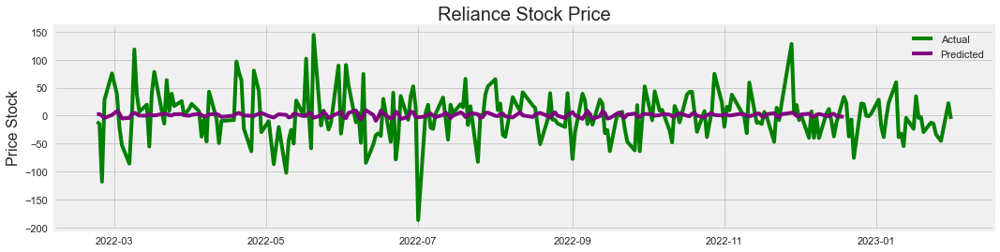

In [62]:
plt.figure(figsize=(16,4))
plt.plot(data_close[-230:], label="Actual", color='green')
plt.plot(predict_arima[-200:], label="Predicted", color='purple')
plt.title('Reliance Stock Price', fontsize=20)
plt.ylabel('Price Stock', fontsize=16)
plt.legend()

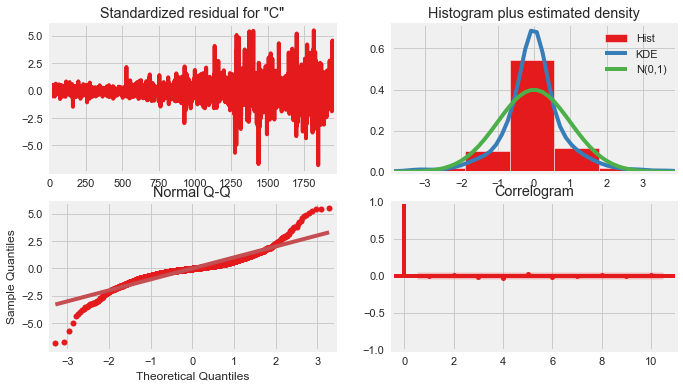

In [63]:
model_ARIMA.plot_diagnostics(figsize=(10,6))
plt.show()

#### Model Accuracy

In [64]:
from sklearn.metrics import mean_squared_error
from math import sqrt
test.mean()
rmse_arima=sqrt(mean_squared_error(predictions,test))
print(rmse_arima)

30.160600325057896


In [65]:
mape(test,predictions)

1.19640655780787

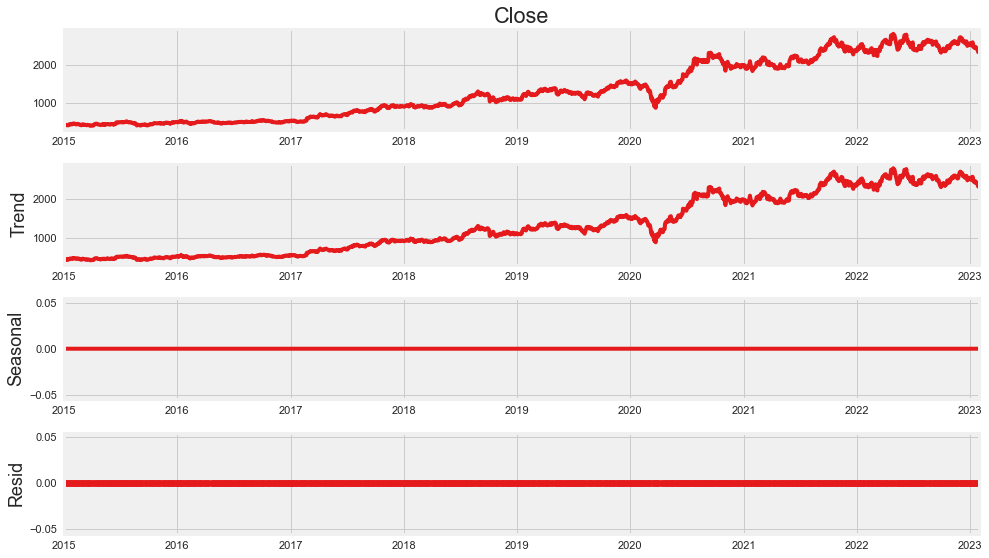

In [66]:
from statsmodels.tsa.seasonal import seasonal_decompose

plt.rc('figure',figsize=(14,8))
plt.rc('font',size=15)

df.sort_index(inplace=True)
result = seasonal_decompose(x=RIL_data['Close'], model='additive', extrapolate_trend='freq', period=1)
fig = result.plot()

###### There is no seasonality but high trend in the data

## SARIMA

SARIMAX(Seasonal Auto-Regressive Integrated Moving Average with eXogenous factors)

In [67]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

sarima = SARIMAX(train,
                order=(1,1,1),
                seasonal_order=(1,1,0,12))
model_sarima = sarima.fit()
predictions2 = model_sarima.predict()

In [68]:
pred_test = model_sarima.predict(start=len(train), end=len(X)-1)

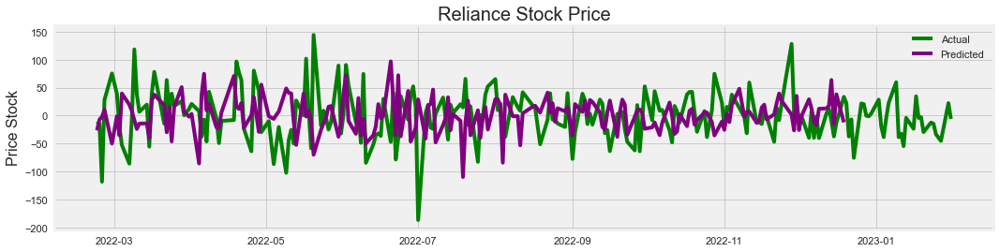

In [69]:
plt.figure(figsize=(16,4))
plt.plot(data_close[-230:], label="Actual", color='green')
plt.plot(predictions2[-200:], label="Predicted", color='purple')
plt.title('Reliance Stock Price', fontsize=20)
plt.ylabel('Price Stock', fontsize=16)
plt.legend()

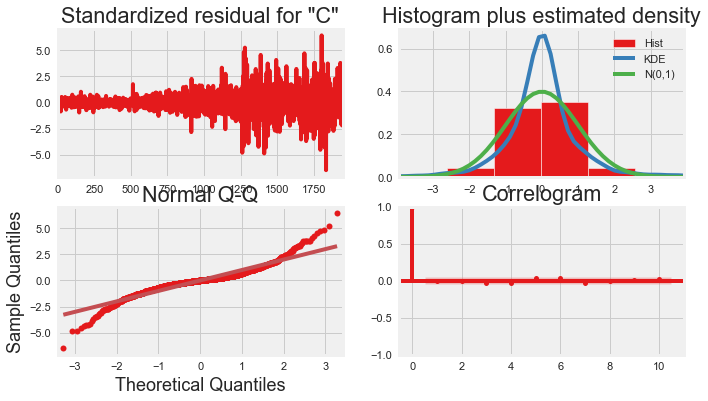

In [70]:
model_sarima.plot_diagnostics(figsize=(10,6))
plt.show()

#### Model Accuracy

In [71]:
rmse_sarima=sqrt(mean_squared_error(test, pred_test))
print(rmse_sarima)

32.64849584112062


In [72]:
mape(test,pred_test)

2.4126214042432386

In [73]:
model_sarima.aic

19222.088629300815

In [74]:
model_AR.aic

18448.521935267814

In [75]:
model_ARIMA.aic

18525.280146052693

In [76]:
#There is no value for AIC that can be considered “good” or “bad” because we simply use AIC as a way to compare regression models. The model with the lowest AIC offers the best fit. The absolute value of the AIC value is not important.

## LSTM

LSTM are sensitive to the scale of the data. so we apply MinMax scaler 

LSTM is extension of RNN which workds according to sequence of data for time series

In [77]:
from sklearn.preprocessing import MinMaxScaler
from keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.optimizers import Adam

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM

from sklearn.metrics import mean_squared_error
from math import sqrt

In [78]:
#pip install keras==2.8

In [79]:
#pip install tensorflow==2.8

In [80]:
data2 = RIL_data.sort_index(ascending = True, axis = 0)

In [81]:
newData = data2[['Close']]

In [82]:
# Calculate the row number to split the dataset into train and test
split = len(newData) - 100

In [83]:
# normalize the new dataset
scaler = MinMaxScaler(feature_range = (0, 1))
finalData = newData.values

In [84]:
trainData = finalData[0:split, :]
validData = finalData[split:, :]

In [85]:
scaledData = scaler.fit_transform(newData)

In [86]:
xTrainData, yTrainData = [], []

In [87]:
for i in range(60, len(trainData)):  # data-flair has used 60 instead of 30
    xTrainData.append(scaledData[i-60:i, 0])
    yTrainData.append(scaledData[i, 0])

In [88]:
xTrainData, yTrainData = np.array(xTrainData), np.array(yTrainData)

In [89]:
xTrainData = np.reshape(xTrainData, (xTrainData.shape[0], xTrainData.shape[1], 1))

In [90]:
# build and train the LSTM model
lstmModel = Sequential()
lstmModel.add(LSTM(units = 50, return_sequences = True, input_shape = (xTrainData.shape[1], 1)))
lstmModel.add(LSTM(units = 50, activation='relu'))
lstmModel.add(Dense(units = 1))

In [91]:
inputsData = newData[len(newData) - len(validData) - 60:].values
inputsData = inputsData.reshape(-1,1)
inputsData = scaler.transform(inputsData)

In [103]:
lstmModel.compile(loss = 'mean_squared_error', optimizer = 'adam')
lstmModel.fit(xTrainData, yTrainData, epochs = 12, batch_size = 1, verbose = 2)

Epoch 1/12
1833/1833 - 71s - loss: 2.3018e-04 - 71s/epoch - 39ms/step
Epoch 2/12
1833/1833 - 64s - loss: 2.4405e-04 - 64s/epoch - 35ms/step
Epoch 3/12
1833/1833 - 67s - loss: 2.1355e-04 - 67s/epoch - 37ms/step
Epoch 4/12
1833/1833 - 66s - loss: 2.1676e-04 - 66s/epoch - 36ms/step
Epoch 5/12
1833/1833 - 66s - loss: 2.1882e-04 - 66s/epoch - 36ms/step
Epoch 6/12
1833/1833 - 69s - loss: 2.1691e-04 - 69s/epoch - 38ms/step
Epoch 7/12
1833/1833 - 71s - loss: 2.1934e-04 - 71s/epoch - 39ms/step
Epoch 8/12
1833/1833 - 71s - loss: 2.1195e-04 - 71s/epoch - 39ms/step
Epoch 9/12
1833/1833 - 71s - loss: 1.9891e-04 - 71s/epoch - 39ms/step
Epoch 10/12
1833/1833 - 67s - loss: 2.1652e-04 - 67s/epoch - 37ms/step
Epoch 11/12
1833/1833 - 69s - loss: 2.2500e-04 - 69s/epoch - 38ms/step
Epoch 12/12
1833/1833 - 70s - loss: 2.1096e-04 - 70s/epoch - 38ms/step


In [104]:
# Take a sample of a dataset to make predictions
xTestData = []

In [105]:
for i in range(60, inputsData.shape[0]):
    xTestData.append(inputsData[i-60:i, 0])

In [106]:
xTestData = np.array(xTestData)

In [107]:
xTestData = np.reshape(xTestData, (xTestData.shape[0], xTestData.shape[1], 1))

In [108]:
predictedClosingPrice = lstmModel.predict(xTestData)
predictedClosingPrice = scaler.inverse_transform(predictedClosingPrice)

In [109]:
# visualize the results
trainData = newData[:split]
validData = newData[split:]

In [110]:
validData['Predictions'] = predictedClosingPrice

<AxesSubplot: title={'center': 'stockTitle'}, xlabel='Date', ylabel='Close Price (Rs.)'>

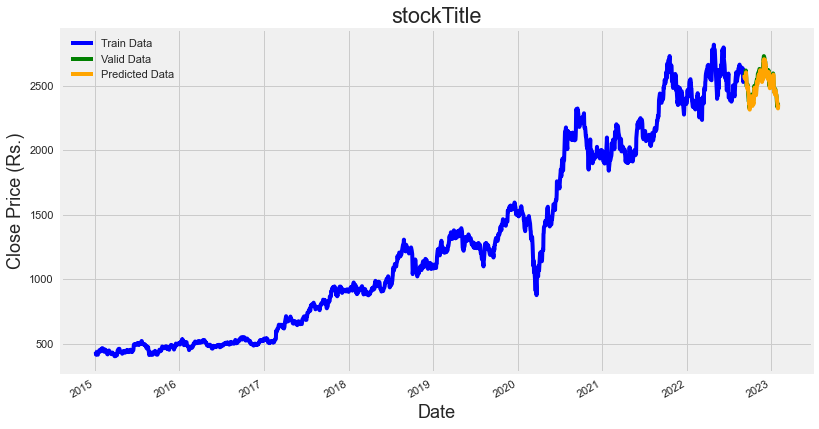

In [111]:
plt.xlabel('Date')
plt.ylabel('Close Price (Rs.)')

trainData['Close'].plot(legend = True, color = 'blue', label = 'Train Data')
validData['Close'].plot(legend = True, color = 'green', label = 'Valid Data')
validData['Predictions'].plot(legend = True, figsize = (12,7), grid = True, color = 'orange', label = 'Predicted Data', title = 'stockTitle')

In [112]:
rmselstm=sqrt(mean_squared_error(validData['Close'],validData['Predictions']))
print(rmselstm)

33.856145713710774


In [113]:
validData

,Close,Predictions
Date,,
2022-09-07,2581.750000,2584.247803
2022-09-08,2585.399902,2562.185791
2022-09-09,2569.300049,2568.944092
2022-09-12,2598.050049,2552.156982
2022-09-13,2619.750000,2585.347656
...,...,...
2023-01-24,2415.949951,2418.380371
2023-01-25,2382.550049,2404.851318
2023-01-27,2337.350098,2370.175293


In [114]:
RIL_data['Close'].max()

2819.850098

In [115]:
#Normalizing the RMSE value to verify whether it's close to 0 or 1
norm_rmse = rmse/ (RIL_data['Close'].max()-RIL_data['Close'].min())
norm_rmse

0.012504708298207686

## FB Prophet

Prophet is a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects. It works best with time series that have strong seasonal effects and several seasons of historical data. Prophet is robust to missing data and shifts in the trend, and typically handles outliers well.

In [121]:
#pip install prophet==1.0

In [124]:
#Importing required libraries
#import fbprophet
from prophet.plot import plot_plotly, plot_components_plotly
from prophet import Prophet

<AxesSubplot: xlabel='Date'>

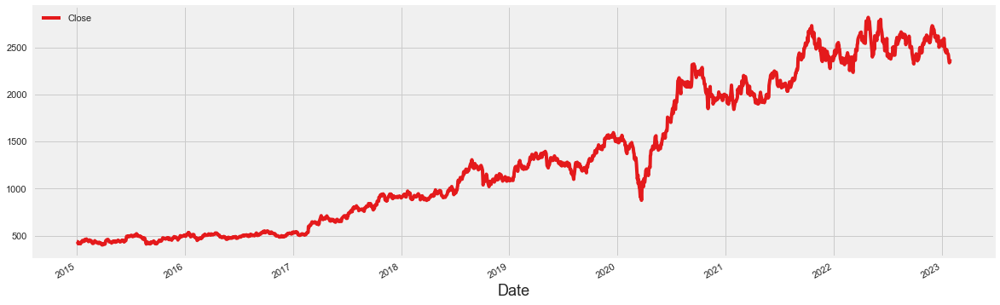

In [125]:
newData.plot(y='Close',figsize=(18,6))

In [126]:
data_Prophet = data[['Date', 'Close']]

In [127]:
data_Prophet.columns = ['ds','y']
data_Prophet['ds'] = pd.to_datetime(data_Prophet['ds'])
data_Prophet.tail()

,ds,y
1989,2023-01-24,2415.949951
1990,2023-01-25,2382.550049
1991,2023-01-27,2337.350098
1992,2023-01-30,2359.750000
1993,2023-01-31,2353.850000


In [128]:
#Spliiting into train test
fbtrain = data_Prophet.iloc[:len(data_Prophet)-365]
fbtest = data_Prophet.iloc[len(data_Prophet)-365:]

In [129]:
import prophet
print(prophet.__version__)

1.1.2


In [130]:
#!pip install pystan==2.19.1.1
#import pystan
#print(pystan.__version__)
!pip install Cython 

Defaulting to user installation because normal site-packages is not writeable


In [131]:
import cmdstanpy
#cmdstanpy.install_cmdstan()
cmdstanpy.install_cmdstan(compiler=True) # only valid on Windows

11:40:08 - cmdstanpy - INFO - Add C++ toolchain to $PATH: C:\Users\Mansi\.cmdstan\RTools40
2023-03-12 11:40:08,352 - INFO     - Add C++ toolchain to $PATH: C:\Users\Mansi\.cmdstan\RTools40


Installing CmdStan version: 2.31.0
Install directory: C:\Users\Mansi\.cmdstan
CmdStan version 2.31.0 already installed


True

In [132]:
import logging
logger = logging.getLogger('cmdstanpy')
logger.setLevel(logging.ERROR)

In [133]:
import pkg_resources
model_file = pkg_resources.resource_filename('prophet', 'stan_model/prophet_model.pkl')
print(model_file)

C:\Users\Mansi\AppData\Roaming\Python\Python39\site-packages\prophet\stan_model\prophet_model.pkl


In [116]:
#m = Prophet()

In [136]:
#m.fit(fbtrain)
#m.fit(fbtrain, iter=5000, algorithm='lbfgs')

In [137]:
#future = m.make_future_dataframe(periods=365)
#forecast = m.predict(future)

## Exponential Soothing

In [416]:
#holts method

In [142]:
#forecast using best model

In [117]:
lstmModel.save('keras_model.h5')

Executing shutdown due to inactivity...


2023-03-12 15:15:55,293 - INFO     - Executing shutdown due to inactivity...


Executing shutdown...


2023-03-12 15:15:59,723 - INFO     - Executing shutdown...
